In [1]:
!pip install torchsummary

In [2]:
!pip install shap 

In [3]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [5]:
import os
import sys 
import shap
import torch
import shutil
import optuna
import warnings
import numpy as np
import pandas as pd
import torch.nn as nn
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
%matplotlib inline


In [6]:
os.listdir('E:\\miniproject\\idata\\Image Dataset\\ImageDataset')

['train', 'valid']

In [7]:
data_dir = 'E:\\miniproject\\idata\\Image Dataset\\ImageDataset'
data_dir

'E:\\miniproject\\idata\\Image Dataset\\ImageDataset'

In [8]:
print('Number of unique plants are 2, potato and tomato\n')
print('Number of diseases are 4, early and late blight disease for tomato, early and late blight for potato\nHowever general classes are 3:\n\tEarly blight\n\tLate blight\n\tHealthy')

Number of unique plants are 2, potato and tomato

Number of diseases are 4, early and late blight disease for tomato, early and late blight for potato
However general classes are 3:
	Early blight
	Late blight
	Healthy


In [9]:
# train and validation directories
train_dir = data_dir + "\\train\\"
valid_dir = data_dir + "\\valid\\"
diseases_tr = os.listdir(train_dir)
diseases_va = os.listdir(valid_dir)

In [10]:
valid_dir

'E:\\miniproject\\idata\\Image Dataset\\ImageDataset\\valid\\'

In [11]:
diseases_tr

['early_blight', 'healthy', 'late_blight']

In [12]:
diseases = []
NumberOfDiseases = 0

for disease in diseases_tr:
    if disease != 'healthy':
        diseases.append(disease)
        NumberOfDiseases += 1
        
diseases

['early_blight', 'late_blight']

In [13]:
# Number of images for each clas in the training data
nums_train = {}
for folder in sorted(os.listdir(f"{data_dir}\\train")):
    nums_train[folder] = len(os.listdir(f"{data_dir}\\train\\{folder}"))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_training_class = pd.DataFrame(nums_train.values(), index=nums_train.keys(), columns=["no. of images"])
img_per_training_class

,no. of images
early_blight,3996
healthy,4011
late_blight,4002


In [14]:
nums_valid = {}
for folder in sorted(os.listdir(valid_dir)):
    nums_valid[folder] = len(os.listdir(os.path.join(valid_dir,folder)))

img_per_valid_class = pd.DataFrame(nums_valid.values(), index=nums_valid.keys(), columns=["no. of images"])
img_per_valid_class

,no. of images
early_blight,442
healthy,443
late_blight,446


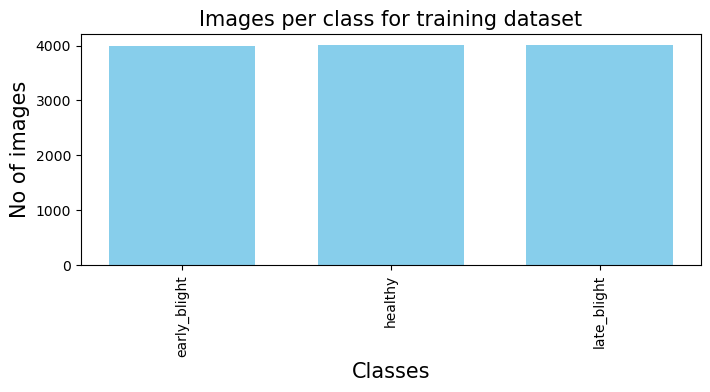

In [15]:
# plotting number of images available for each class
index = [n for n in range(3)]
plt.figure(figsize=(8, 3))
plt.bar(index, [n for n in nums_train.values()], color='skyblue', width=0.7, align='center')
plt.xlabel('Classes', fontsize=15)
plt.ylabel('No of images', fontsize=15)
plt.xticks(index, [key for key in nums_train.keys()], fontsize=10, rotation=90)
plt.title('Images per class for training dataset', fontsize=15)
plt.show()

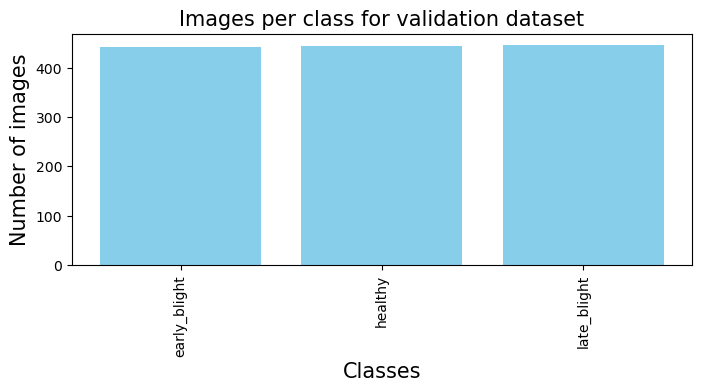

In [16]:
keys = list(nums_valid.keys())
values = list(nums_valid.values())

plt.figure(figsize=(8, 3))
plt.bar(keys, values, color='skyblue')
plt.xlabel('Classes', fontsize=15)
plt.ylabel('Number of images', fontsize=15)
plt.title('Images per class for validation dataset', fontsize=15)
plt.xticks(rotation=90)
plt.show()

In [17]:
n_train=0
for value in nums_train.values():
    n_train+= value
print(f"There are {n_train} images for training")

There are 12009 images for training


In [18]:
n_valid=0
for value in nums_valid.values():
    n_valid+= value

print(f"There are {n_valid} images for validation")

There are 1331 images for validation


In [19]:
#checking if there are any non image files in training and testing folder
folds= [folder for folder in os.listdir(train_dir)]
folds

['early_blight', 'healthy', 'late_blight']

In [20]:
#checking for any non-valid image in train test
train_dir = "E:/miniproject/idata/Image Dataset/ImageDataset/train"
folds = [folder for folder in os.listdir(train_dir)]

for folder in folds:
    folder_path = os.path.join(train_dir, folder)
    for img in os.listdir(folder_path):
        if not img.endswith('.JPG'):
            print('Non-image file present in', folder_path)
        

In [21]:
folds= [folder for folder in os.listdir(valid_dir)]
folds

['early_blight', 'healthy', 'late_blight']

In [22]:
valid_dir = "E:/miniproject/idata/Image Dataset/ImageDataset/valid"
folds = [folder for folder in os.listdir(valid_dir)]

for folder in folds:
    folder_path = os.path.join(valid_dir, folder)
    for img in os.listdir(folder_path):
        if not img.endswith('.JPG'):
            print('Non-image file present in', folder_path)
        

In [23]:
#data preparation for training

print(train_dir)
print(valid_dir)

E:/miniproject/idata/Image Dataset/ImageDataset/train
E:/miniproject/idata/Image Dataset/ImageDataset/valid


In [24]:
# datasets for validation and training
train = ImageFolder(train_dir, transform=transforms.Compose(
                                        [transforms.Resize([256, 256]),
                                         transforms.ToTensor()]))

valid = ImageFolder(valid_dir, transform=transforms.Compose(
                                        [transforms.Resize([256, 256]),
                                         transforms.ToTensor()]))

In [25]:
#Image shape 0--early-blight ,1--healthy, 2--late-blight
img, label = train[4579]
print(img.shape,label)

img, label = train[0]
print(img.shape,label)

img, label = train[11678]
print(img.shape,label)

torch.Size([3, 256, 256]) 1
torch.Size([3, 256, 256]) 0
torch.Size([3, 256, 256]) 2


In [26]:
len(train.classes)

3

In [27]:
print(train.classes)

['early_blight', 'healthy', 'late_blight']


In [28]:
# for checking some images from training dataset
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    

In [29]:
# Setting the seed value
random_seed = 7
torch.manual_seed(random_seeda)

Label :late_blight(2)


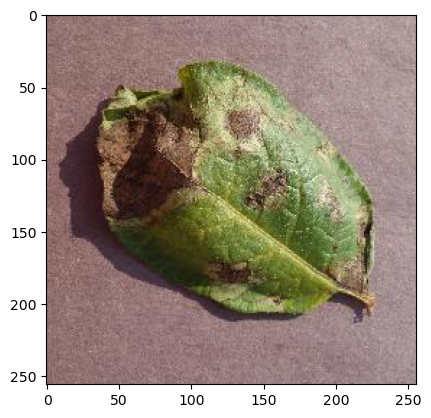

In [30]:
show_image(*train[10000])

Label :healthy(1)


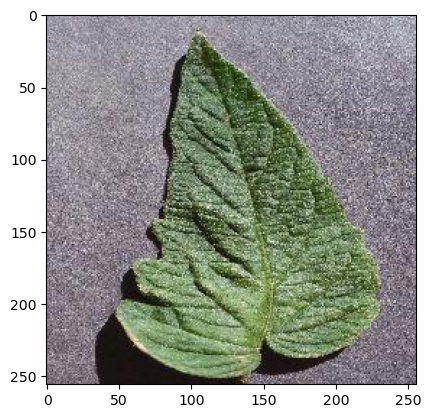

In [31]:
show_image(*train[6580])

Label :early_blight(0)


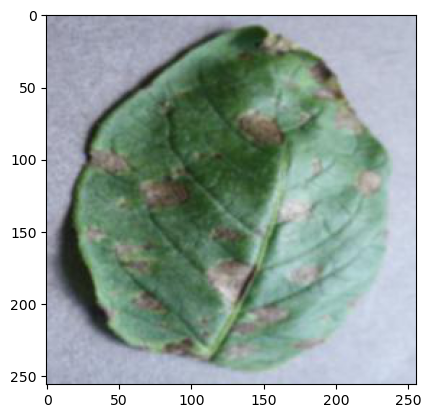

In [32]:
show_image(*train[500])

In [33]:
#print(train,'\n')
#print(valid)

In [34]:
# DataLoaders for training and validation
# setting the batch size
batch_size = 32
train_dl = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

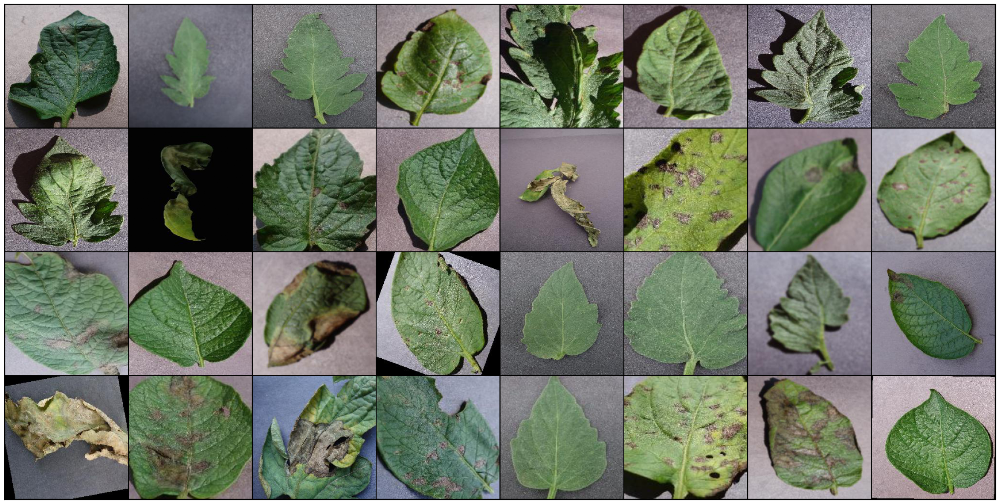

In [35]:
# helper function to show a batch of training instances
from torchvision.utils import make_grid
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break
        
# Images for first batch of training
show_batch(train_dl) 

In [36]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [37]:
device = get_default_device()
device

device(type='cuda')

In [38]:
train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)

In [39]:
class SimpleResidualBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.conv2(out)
        return self.relu2(out) + x # ReLU can be applied before or after adding the input

In [40]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))


# base class for the model
# base class for the model
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        train_acc = accuracy(out, labels)
        return loss
    
    def training_step_4_acc(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        train_acc = accuracy(out, labels)
        return train_acc
        
        
    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}
    
    
    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss  
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, train_accuracy: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['train_accuracy'], result['val_loss'], result['val_accuracy']))
        

In [41]:
# Architecture for training
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)


# resnet architecture 
class ResNet9(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) # out_dim : 128 x 64 x 64 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) # out_dim : 256 x 16 x 16
        self.conv4 = ConvBlock(256, 512, pool=True) # out_dim : 512 x 4 x 44
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases),
                                       nn.Softmax(dim=1))
        
    def forward(self, xb): # xb is the loaded batch
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out        

In [42]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
Note: you may need to restart the kernel to use updated packages.


In [43]:
#defining the model 
model = to_device(ResNet9(3, len(train.classes)), device) 
model

ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

In [44]:
#getting summary of the model
INPUT_SHAPE = (3, 256, 256)

print(summary(model.cuda(), (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14          [-1, 256,

In [45]:
#functions for training the network
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    

def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, momentum=0, weight_decay=0,
                 grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay, momentum)
         
    
    # scheduler for one cycle learniing rate
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        train_accuracies = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            t_acc = model.training_step_4_acc(batch)
            train_losses.append(loss)
            train_accuracies.append(t_acc)
            loss.backward()
            
            
            # gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
            
    
        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['train_accuracy'] = torch.stack(train_accuracies).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history
    

In [46]:
%%time
history = [evaluate(model, valid_dl)]
history

CPU times: total: 45.3 s
Wall time: 1min 29s


[{'val_loss': tensor(1.0989, device='cuda:0'), 'val_accuracy': tensor(0.3289)}]

In [47]:
def train_and_evaluate(param, model, train_loader, val_loader, trial):
    torch.cuda.empty_cache()
    history = []
    
    #optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    #opt_func = getattr(torch.optim, param['optimizer'])
    optimizer = getattr(torch.optim, param['optimizer'])(model.parameters(), lr=param['initial_lr'], weight_decay=param['weight_decay'], momentum=param['momentum'])

        
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, param['initial_lr'], epochs=param['epochs'], steps_per_epoch=len(train_loader))

    for epoch in range(param['epochs']):
        # Training
        model.train()
        train_losses = []
        train_accuracies = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            t_acc = model.training_step_4_acc(batch)
            train_losses.append(loss)
            train_accuracies.append(t_acc)
            loss.backward()
            
            # gradient clipping
            if param['grad_clip']: 
                nn.utils.clip_grad_value_(model.parameters(), param['grad_clip'])
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
            
        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['train_accuracy'] = torch.stack(train_accuracies).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        val_acc_last_epoch = history[-1]['val_accuracy'].item()   
        
        trial.report(val_acc_last_epoch, epoch)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

        
        return val_acc_last_epoch

In [48]:
def objective(trial):
    params = {'initial_lr': trial.suggest_loguniform('initial_lr', 0.01, 0.06),
              'optimizer': trial.suggest_categorical("optimizer", ["SGD"]),
              'weight_decay': trial.suggest_loguniform('weight_decay', 1e-4, 1e-1),
              'grad_clip': trial.suggest_float('grad_clip', 0.1, 0.5),
              'epochs' : trial.suggest_int('epochs', 8, 25), 
              'momentum' : trial.suggest_float('momentum', 0, 1),
              }
    
    val_accuracy = train_and_evaluate(params, model, train_dl, valid_dl, trial)
    return val_accuracy #train_and_evaluate(params, model, train_dl, valid_dl)

In [49]:

import torch
# Clear GPU memory in PyTorch
torch.cuda.empty_cache()

In [50]:
# Deprecated: suggest_loguniform
# optuna.study.create_study(sampler=optuna.samplers.TPESampler(seed=42))
# study.optimize(lambda trial: trial.suggest_loguniform('learning_rate', 1e-5, 1e-2), n_trials=100)

#optuna.study.create_study(sampler=optuna.samplers.TPESampler(seed=42))
#study.optimize(lambda trial: trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True), n_trials=100)
import optuna

# Create a study object
study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42))

# Define the objective function
def objective(trial):
    return trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

# Optimize the study
study.optimize(objective, n_trials=100)


[I 2024-03-14 16:02:33,804] A new study created in memory with name: no-name-dc144e4d-3a48-4ebc-a7b6-5ddffab51731
[I 2024-03-14 16:02:33,806] Trial 0 finished with value: 0.0001329291894316216 and parameters: {'learning_rate': 0.0001329291894316216}. Best is trial 0 with value: 0.0001329291894316216.
[I 2024-03-14 16:02:33,807] Trial 1 finished with value: 0.0071144760093434225 and parameters: {'learning_rate': 0.0071144760093434225}. Best is trial 0 with value: 0.0001329291894316216.
[I 2024-03-14 16:02:33,808] Trial 2 finished with value: 0.001570297088405539 and parameters: {'learning_rate': 0.001570297088405539}. Best is trial 0 with value: 0.0001329291894316216.
[I 2024-03-14 16:02:33,809] Trial 3 finished with value: 0.0006251373574521745 and parameters: {'learning_rate': 0.0006251373574521745}. Best is trial 0 with value: 0.0001329291894316216.
[I 2024-03-14 16:02:33,810] Trial 4 finished with value: 2.9380279387035334e-05 and parameters: {'learning_rate': 2.9380279387035334e-05

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.


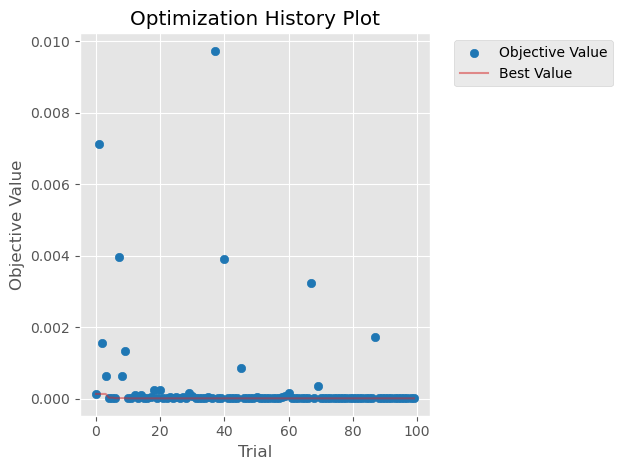

In [51]:
# optuna.visualization.plot_optimization_history(study)  #visualizing the tuning 
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.rcParams['figure.figsize']=[6,6]
plt.rcParams['figure.facecolor'] = 'white'
plt.tight_layout()
#plt.savefig('/kaggle/working/opt_hist_plot.png', dpi=600, bbox_inches="tight")
#plt.savefig('/kaggle/working/gblurred_sample_imgs.png', dpi=600, bbox_inches="tight")  #sample images and their corresponding andom rotations
plt.show()

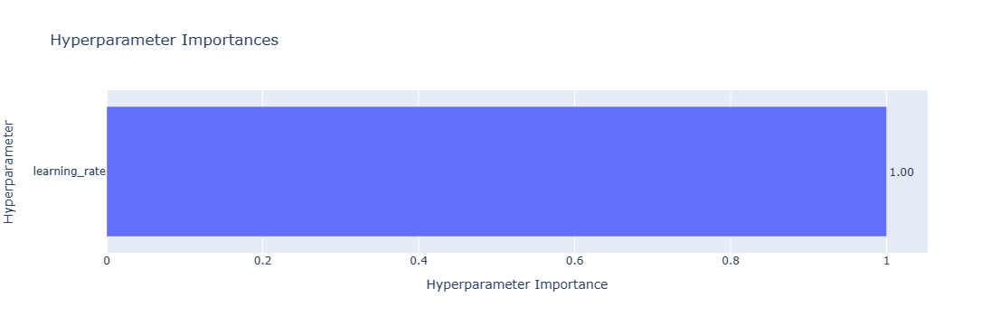

In [52]:
optuna.visualization.plot_param_importances(study) #visualizing the parameter importances  #what is the difference between this plot and the one below

In [53]:
import torch

# Clear GPU memory in PyTorch
torch.cuda.empty_cache()


In [54]:
#%%time 
epochs =5
momentum = 0.42  
grad_clip = 0.13
initial_lr = 0.011
weight_decay = 0.00018
opt_func = torch.optim.SGD

history = fit_OneCycle(epochs, initial_lr, model, train_dl, valid_dl, 
                       momentum=0.42, 
                       grad_clip=0.13, 
                       weight_decay=0.00018, 
                       opt_func=opt_func)

Epoch [0], last_lr: 0.00835, train_loss: 0.7346, train_accuracy: 0.8156, val_loss: 0.6954, val_acc: 0.8616
Epoch [1], last_lr: 0.01046, train_loss: 0.6132, train_accuracy: 0.9382, val_loss: 0.7714, val_acc: 0.7746
Epoch [2], last_lr: 0.00672, train_loss: 0.5812, train_accuracy: 0.9698, val_loss: 0.5750, val_acc: 0.9754
Epoch [3], last_lr: 0.00207, train_loss: 0.5647, train_accuracy: 0.9870, val_loss: 0.5702, val_acc: 0.9821
Epoch [4], last_lr: 0.00000, train_loss: 0.5575, train_accuracy: 0.9943, val_loss: 0.5662, val_acc: 0.9859


In [112]:
def plot_accuracies(history, epochs):
    """This function plots both training and validation accuracies of ResNet-9 model"""
    plt.rcParams['figure.figsize'] = [8, 8]
    epochs = [i for i in range(1, epochs+1)]
    val_accuracies = [x['val_accuracy'] for x in history]
    train_accuracies = [x['train_accuracy'] for x in history]
    plt.plot(epochs, train_accuracies, '-o', color='blue', label='train_loss')
    plt.plot(epochs, val_accuracies, '-o', color='green', label='validation_loss')
    plt.xticks(np.arange(min(epochs), max(epochs)+1, 1.0))
    plt.xlabel('Epochs', size=13)
    plt.ylabel('Accuracies', size=13)
    plt.grid(color='#EAE4E3')
    #plt.xticks(rotation=90)
    plt.title('Training and validation accuracies of ResNet-9', size=13)
    plt.legend()
   # plt.savefig('../working/resnet9-tv-accuracies.png', dpi=600,  bbox_inches="tight")
    plt.show()
    
def plot_losses(history, epochs):
    plt.rcParams['figure.figsize'] = [8, 8]
    epochs = [i for i in range(1, epochs+1)]
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x.get('val_loss').cpu().numpy() for x in history]
    plt.plot(epochs, train_losses, '-o', color='blue', label='train_loss')
    plt.plot(epochs, val_losses, '-o', color='green', label='validation_loss')
    plt.xticks(np.arange(min(epochs), max(epochs)+1, 1.0))
    plt.xlabel('Epochs', size=13)
    plt.ylabel('Losses', size=13)
    plt.grid(color='#EAE4E3')
    #plt.xticks(rotation=90)
    plt.title('Training and validation losses of ResNet-9', size=13)
    plt.legend()
    #plt.savefig('../working/resnet9-tv-losses.png', dpi=600,  bbox_inches="tight")
    plt.show()

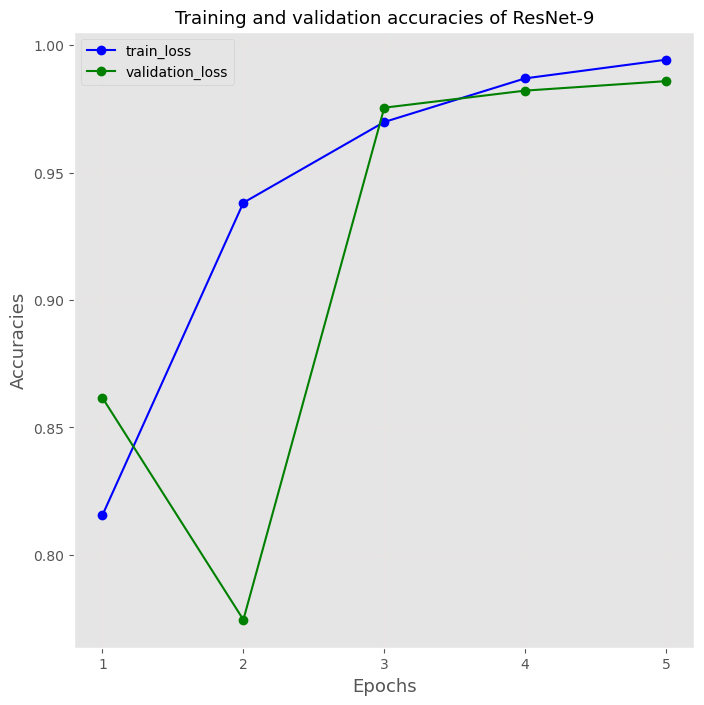

In [113]:
#Validation accuracy
plot_accuracies(history, epochs)

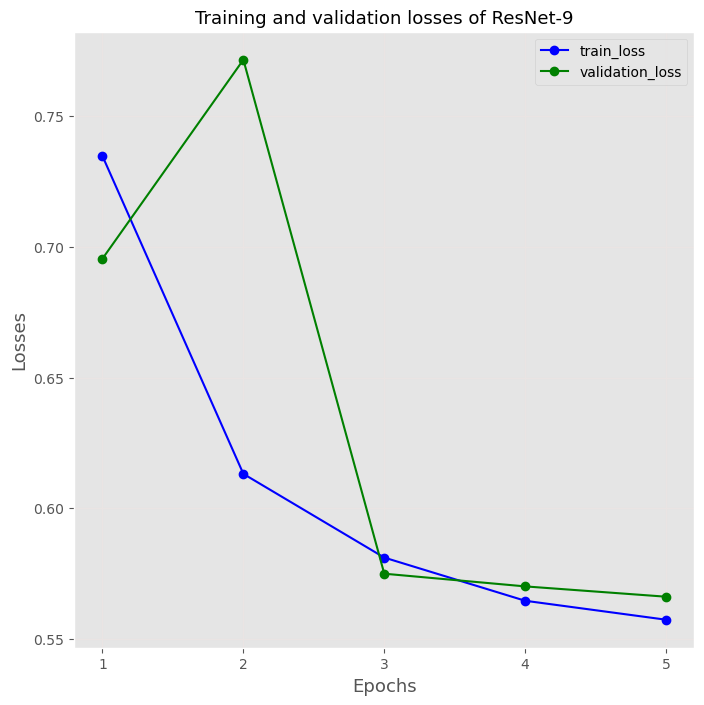

In [114]:
#Validation loss
plot_losses(history, epochs)

In [115]:

###Creating a new test dir because there was an svn file or folder found in the test dir
os.mkdir('E:/miniproject/idata/Image Dataset/ImageDataset/test_data')
os.mkdir('E:/miniproject/idata/Image Dataset/ImageDataset/test_data/test')

In [123]:
test_dir_old = 'E:/miniproject/idata/Image Dataset/test_data/test'
test_dir_new = 'E:/miniproject/idata/Image Dataset/ImageDataset/test_data'
print(test_dir_old)
print(test_dir_new)

E:/miniproject/idata/Image Dataset/test_data/test
E:/miniproject/idata/Image Dataset/ImageDataset/test_data


In [124]:
# import os
for f in os.listdir(f'{test_dir_new}/test'):
    os.remove(f'{test_dir_new}/test/{f}')

In [125]:
for theclass in train.classes:
#     print(f"{test_dir_new}/test/{theclass}")
    os.mkdir(f"{test_dir_new}/test/{theclass}")

In [126]:

os.listdir(f'{test_dir_new}/test')

['early_blight', 'healthy', 'late_blight']

In [127]:
'tomato_late_23.JPG'.split('_')[1] + '_blight'

'late_blight'

In [153]:
###Moving file from old test dir to new test dir
num_moved = 0
for img in os.listdir(test_dir_old):
    if img.endswith('.JPG'):
        if img.split('_')[1] !='healthy':
            theclass = img.split('_')[1] + '_blight'
            #print(theclass)
            shutil.copy(f"{test_dir_old}/{img}", f"{test_dir_new+'/test'}/{theclass}/{img}")
        
        elif img.split('_')[1] =='healthy':
            theclass = img.split('_')[1] 
            #print(theclass)
            shutil.copy(f"{test_dir_old}/{img}", f"{test_dir_new+'/test'}/{theclass}/{img}")
        
        num_moved += 1
    elif img.endswith('svn'):
        print('not going to move you!')
print(f"Number of files moved: {num_moved}")

Number of files moved: 1331


In [154]:
len(os.listdir(f'{test_dir_new}/test')) #3 folders which are early_blight, healthy and late_blight

3

In [155]:

len(os.listdir('../test_data/test')) #files have been moved

3

In [157]:

#Testing model on test data
test = ImageFolder('E:/miniproject/idata/Image Dataset/ImageDataset/test_data/test', transform=transforms.Compose(
                                        [transforms.Resize([256, 256]),
                                         transforms.ToTensor()]))

In [158]:
early = os.listdir(test_dir_new + '/test/healthy')
healthy = os.listdir(test_dir_new + '/test/early_blight')
late = os.listdir(test_dir_new + '/test/late_blight')

test_images = sorted(early+healthy+late) # since images in test folder are not in alphabetical order
print(len(test_images))

1331


In [159]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

In [160]:
img, label = test[-1]
label

2

Label: tomato_late_207.JPG , Predicted: late_blight


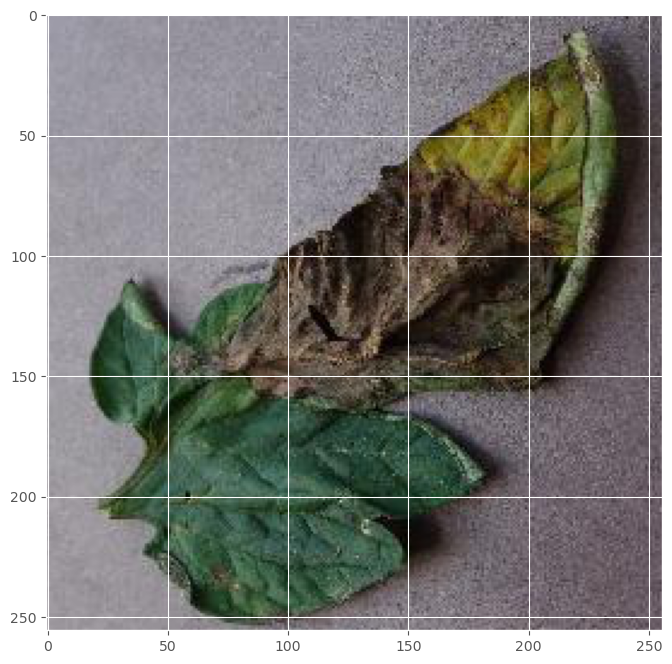

In [161]:
# predicting first image
img, label = test[1000]
plt.imshow(img.permute(1, 2, 0))
print('Label:', test_images[1000], ', Predicted:', predict_image(img, model))

In [162]:
test_loader_r = torch.utils.data.DataLoader(test, 
                                            batch_size=batch_size,
                                            shuffle=True)

test_loader_r = DeviceDataLoader(test_loader_r, device)
test_loader_r

In [163]:
predictions =[] #code adapted from https://stackoverflow.com/questions/63647547/how-to-find-confusion-matrix-and-plot-it-for-image-classifier-in-pytorch
targets = []
for images, labels in test_loader_r:
    images, labels = images.cuda(), labels.cuda()
    logps = model(images)
    output = torch.exp(logps)
    pred = torch.argmax(output, 1)

    # convert to numpy arrays
    pred = pred.detach().cpu().numpy()
    labels = labels.detach().cpu().numpy()
    
    for i in range(len(pred)):
        predictions.append(pred[i])
        targets.append(labels[i])

In [164]:
train.classes

['early_blight', 'healthy', 'late_blight']

In [165]:
targets[:5]

[2, 0, 2, 0, 0]

In [166]:
predictions[:5]

[2, 2, 2, 0, 0]

In [167]:
#confusion matrix
cf_matrix = confusion_matrix(targets, predictions)
cf_matrix

array([[428,   0,  14],
       [  0, 249,   1],
       [  5,   0, 634]], dtype=int64)

In [168]:
class_names = train.classes
dataframe = pd.DataFrame(cf_matrix, index=class_names, columns=class_names)
dataframe

,early_blight,healthy,late_blight
early_blight,428,0,14
healthy,0,249,1
late_blight,5,0,634


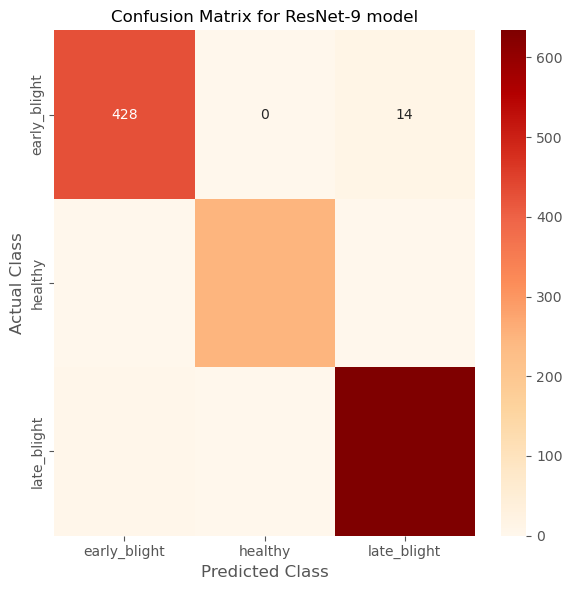

In [170]:
plt.figure(figsize=(6, 6))  

#Create heatmap
sns.heatmap(dataframe, annot=True, cbar=True,cmap="OrRd",fmt="d") #'purples', 'PuRd'
plt.title("Confusion Matrix for ResNet-9 model", size=12), plt.tight_layout()
 
plt.ylabel("Actual Class", size=12), 
plt.xlabel("Predicted Class",  size=12)
plt.tight_layout()
#plt.savefig('../working/cmatrxresnet9.png', dpi=600,  bbox_inches="tight")
plt.show()

In [171]:
print("Test Accuracy : {}".format(accuracy_score(targets, predictions)))
print("\nConfusion Matrix : ")
print(confusion_matrix(targets, predictions))
print("\nClassification Report :")
print(classification_report(targets, predictions, target_names=train.classes))

Test Accuracy : 0.9849737039819685

Confusion Matrix : 
[[428   0  14]
 [  0 249   1]
 [  5   0 634]]

Classification Report :
              precision    recall  f1-score   support

early_blight       0.99      0.97      0.98       442
     healthy       1.00      1.00      1.00       250
 late_blight       0.98      0.99      0.98       639

    accuracy                           0.98      1331
   macro avg       0.99      0.99      0.99      1331
weighted avg       0.99      0.98      0.98      1331

